
**Aplicaremos la arquitectura DiscoGAN**

Citas. En este notebook vamos a intentar aplicar el paper https://arxiv.org/abs/1703.05192
esta implementado en keras en el siguiente github https://github.com/eriklindernoren/Keras-GAN/tree/master/discogan

En este momento, estamos estudiando si es posible completar el TFM , asi que voy a usar la implementación disponible en el git mencionado.

Recordemos, en los notebooks anteriores, hemos conseguido nuestros trazos del coche que simulan un coche dibujado manualmente ademas hemos echo nuestro augmentador y generador random de imagenes

Ahora lo que queremos es saber si aplicando algunas de las arquitecturas conocidas somos capaces de reconstruir in coche solo mediante sus trazos.

Aqui algunas de las arquitecturas disponibles

* DiscoGAN
* SuperResolution
* PixToPix
* CycleGAN


In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
print(os.listdir("../input"))

import numpy as np
import pandas as pd
import os
from skimage.transform import resize
from keras.preprocessing.image import array_to_img, img_to_array, load_img#,save_img
from skimage.io import imread, imshow #, concatenate_images
import PIL 
from PIL import Image
import re

['manualdraw', 'carvana-image-masking-challenge']


Using TensorFlow backend.


In [2]:
!mkdir images
#!ls -l '../input/train'

Preparamos unas cuantas funciones para leer del directorio

In [3]:
def files_names_in_path(path="",extension=".jpg"):
    files = []
    masks = []
    for f in os.listdir(path):
        filename, file_extension = os.path.splitext(f)
        if file_extension == '.gif':
            files.append(filename.replace('_mask','')+".jpg")
            masks.append(filename+"_mask.gif")
            
    return files, masks
car_path = '../input/carvana-image-masking-challenge/train/'
mask_path = '../input/carvana-image-masking-challenge/train_masks/'
input_files,input_masks = files_names_in_path(mask_path)

print(input_files[0:5])


['4b74275babf7_02.jpg', '3071362591f7_04.jpg', '0495dcf27283_10.jpg', 'd1a3af34e674_01.jpg', 'fc237174b128_09.jpg']


[[[0.90588235 0.90588235 0.90588235]
  [0.90588235 0.90588235 0.90588235]
  [0.90588235 0.90588235 0.90588235]
  ...
  [0.92156863 0.92156863 0.92156863]
  [0.92156863 0.92156863 0.92156863]
  [0.92156863 0.92156863 0.92156863]]

 [[0.90588235 0.90588235 0.90588235]
  [0.90588235 0.90588235 0.90588235]
  [0.90588235 0.90588235 0.90588235]
  ...
  [0.92156863 0.92156863 0.92156863]
  [0.92156863 0.92156863 0.92156863]
  [0.92156863 0.92156863 0.92156863]]

 [[0.90588235 0.90588235 0.90588235]
  [0.90588235 0.90588235 0.90588235]
  [0.90588235 0.90588235 0.90588235]
  ...
  [0.92156863 0.92156863 0.92156863]
  [0.92156863 0.92156863 0.92156863]
  [0.92156863 0.92156863 0.92156863]]

 ...

 [[0.7372549  0.75294118 0.76470588]
  [0.7372549  0.75294118 0.76470588]
  [0.73333333 0.74901961 0.76078431]
  ...
  [0.84705882 0.78823529 0.80784314]
  [0.83921569 0.78039216 0.8       ]
  [0.83137255 0.77254902 0.79215686]]

 [[0.7372549  0.75294118 0.76470588]
  [0.7372549  0.75294118 0.76470588]


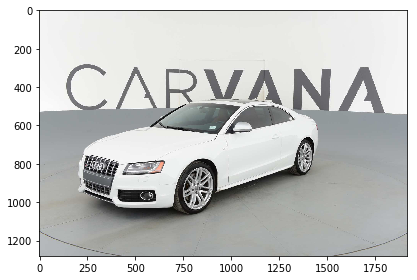

In [4]:
def load_image_and_normalize_and_resize(file_path="",normalize=True):
    if normalize:
        return (imread(file_path)/255)
    else:
        return (imread(file_path))
    

print(load_image_and_normalize_and_resize(car_path+np.random.choice(input_files,1)[0]))
print(imshow(load_image_and_normalize_and_resize(car_path+np.random.choice(input_files,2)[0])))
print(load_image_and_normalize_and_resize(car_path+np.random.choice(input_files,1)[0]).shape)
HEIGH = load_image_and_normalize_and_resize(car_path+np.random.choice(input_files,1)[0]).shape[0]
WIDTH = load_image_and_normalize_and_resize(car_path+np.random.choice(input_files,1)[0]).shape[1]

In [5]:
mask = pd.read_csv('../input/carvana-image-masking-challenge/train_masks.csv')

In [6]:
len(mask)

5088

In [7]:
# ignore this function not needed finally... reference https://www.kaggle.com/robertkag/rle-to-mask-converter finally not used but i like this function i saved..

import numpy as np # linear algebra
#(1280, 1918, 3)

def rleToMask(rleString,height,width):
    rows, cols = height,width
    rleNumbers = [int(numstring) for numstring in rleString.split(' ')]
    rlePairs = np.array(rleNumbers).reshape(-1,2)
    img = np.zeros(rows*cols,dtype=np.uint8)
    for index,length in rlePairs:
        index -= 1
        img[index:index+length] = 255
    img = img.reshape(cols,rows)
    img = img.T
    return img

In [8]:
#index=3
#temp_mask = rleToMask(mask['rle_mask'][3],WIDTH,HEIGH)
#print(temp_mask.shape)
#rotated_mask = np.rot90(np.rot90(np.rot90(temp_mask)))
#imshow(rotated_mask)


In [9]:
# empezamos a trabajar para obtener la mascara del coche solo nos interesa el coche para mejorar el performanc
# ademas queremos simular los trazos humanos extrayendo los edges del coche (pero solo del coche, el fondo no nos interesa)
import cv2
indx=5000
carimage = car_path+input_files[indx]
maskimage = mask_path+input_files[indx].replace('.jpg','_mask.gif')

print(carimage)
print(maskimage)
img = cv2.imread(carimage)
#mask = cv2.imread(maskimage)
mask=imread(maskimage)
print(mask)

# get first masked value (foreground)
fg = cv2.bitwise_or(img, img, mask=mask)
# get second masked value (background) mask must be inverted
mask = cv2.bitwise_not(mask)
background = np.full(img.shape, 255, dtype=np.uint8)
bk = cv2.bitwise_or(background, background, mask=mask)

# combine foreground+background
final = cv2.bitwise_or(fg, bk)

../input/carvana-image-masking-challenge/train/fff9b3a5373f_12.jpg
../input/carvana-image-masking-challenge/train_masks/fff9b3a5373f_12_mask.gif
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


Bien hay que tener presente el objetivo, el objetivo final es usar la liberia OpenCv, en concreto el alghotirmo de CanyEdge detection, que nos permite resaltar y extraer contornos de una imagen, esta imagen va a suer nuestros inputs en las GAN, es decir seremos capaz de reconstruir un coche solamente conociendo su contorno?
Para ellos i conociendo a priori el Canny Edge detection, va a funcionar mejor si somos capaces de extraer de la imagen completa unicamente los elementos que nos interesan, es decir solo el coche

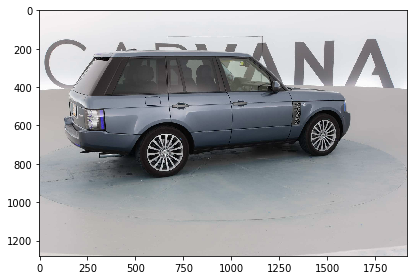

In [10]:
#La imagen original
imshow(img)

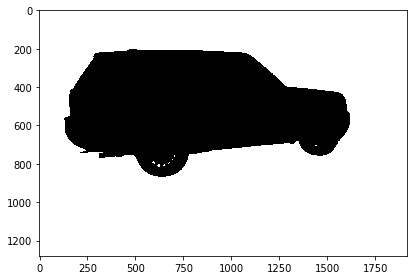

In [11]:
#La mascara
imshow(mask)

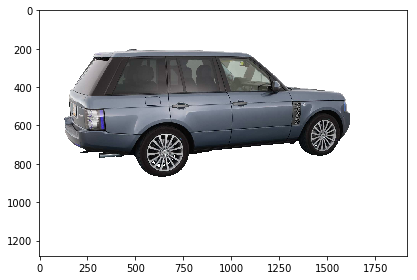

In [12]:
#La imagen del coche aplicando la mascara
# BIEN!!! ahora vamos a intentar extraer los contornos!!
imshow(final)

# Empezamos con un ejemplo basico de la pagina de OpenCV

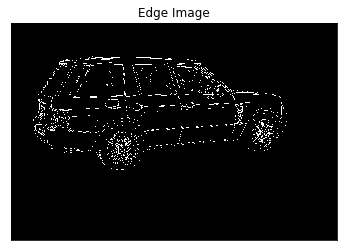

In [13]:

import cv2
import numpy as np
from matplotlib import pyplot as plt

img = final
edges = cv2.Canny(img,50,100)

#plt.subplot(121),
plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
#plt.subplot(122),
plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

plt.show()
#La aproximación no es muy buena necessitamos las lineas del contorno

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


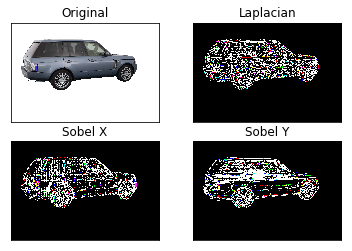

In [14]:
# Usamos otro ejemplo de la pagina OpenCV
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = final

laplacian = cv2.Laplacian(img,cv2.CV_64F)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)

plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])

plt.show()

Estabamos por buen camino, antes de applicar el cannyedge detection tal como explica en la doc de OpenCV, antes se debia de corregir las imagenes aplicando GaussianBlur i erode para cerrar gaps
Adjunto fuentes de información
#https://stackoverflow.com/questions/21104664/extract-all-bounding-boxes-using-opencv-python/21108680
#https://stackoverflow.com/questions/13887863/extract-bounding-box-and-save-it-as-an-image
#https://www.kaggle.com/ayalamann/bounding-boxes-using-image-processing
#https://cvisiondemy.com/extract-roi-from-image-with-python-and-opencv/

(1280, 1918)


255

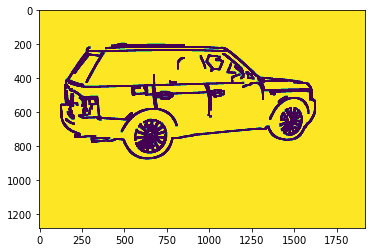

In [15]:
def get_edge_v2(img):
    blurred = cv2.GaussianBlur(img, (7,7), 0) # Remove noise
    #close the small line gaps using errosion
    kernel = np.ones((3,3), np.uint8)
    erode = cv2.erode(blurred, kernel, iterations = 3)
    #plt.imshow(erode)
    #cannyedge 
    def canny_edge_detector(input_img, threshold1, threshold2, draw=True, save=True):
        canny_img = cv2.cvtColor(np.copy(input_img), cv2.COLOR_BGR2GRAY)
        edges = cv2.Canny(canny_img, threshold1, threshold2)
        return edges
    #try adding Eroding before edge detection(increase black lines)
    canny_edges = canny_edge_detector(input_img=erode, threshold1=100, threshold2=150) 
    #return np.invert(canny_edges)#return np.invert(canny_edges)
    #plt.imshow(canny_edges)

    #close the small line gaps using dilation
    kernel = np.ones((5,5), np.uint8)
    dilation_canny = cv2.dilate(canny_edges, kernel, iterations = 3)
    canny_blurred = cv2.GaussianBlur(dilation_canny, (3,3), 0) # Remove noise
    #invetimos la mascara queremos el blanco de fondo y el negro como dibujo del coche
    return np.invert(canny_blurred)
ret =get_edge_v2(final)
plt.imshow(ret)
print(ret.shape)
np.max(ret)


Es Fantastico!!! con esto podemos seguir adelante con el TFM!!! Nos preparamos una función get edges random que usaremos en los data augmentation!

In [16]:
def get_edge_v2_randoms(img):
    choise=[3,5,7]
    x = np.random.choice(choise,1)
    
    blurred = cv2.GaussianBlur(img, (x,x), 0) # Remove noise
    #close the small line gaps using errosion
    x = np.random.randint(2,5)
    kernel = np.ones((x,x), np.uint8)
    x = np.random.randint(2,5)
    erode = cv2.erode(blurred, kernel, iterations = x)
    # plt.imshow(erode)
    #cannyedge 
    def canny_edge_detector(input_img, threshold1, threshold2, draw=True, save=True):
        canny_img = cv2.cvtColor(np.copy(input_img), cv2.COLOR_BGR2GRAY)
        edges = cv2.Canny(canny_img, threshold1, threshold2)
        return edges
    #try adding Eroding before edge detection(increase black lines)
    x = np.random.randint(80,125)
    y = np.random.randint(135,180)
    canny_edges = canny_edge_detector(input_img=erode, threshold1=100, threshold2=150) 
    #return np.invert(canny_edges)
    # plt.imshow(canny_edges)

    #close the small line gaps using dilation
    x = np.random.randint(2,5)
    kernel = np.ones((x,x), np.uint8)
    x = np.random.randint(2,5)
    dilation_canny = cv2.dilate(canny_edges, kernel, iterations = x)
    
    x = np.random.choice(choise,1)
    canny_blurred = cv2.GaussianBlur(dilation_canny, (x,x), 0) # Remove noise
    return np.invert(canny_blurred)


(1280, 1918)


255

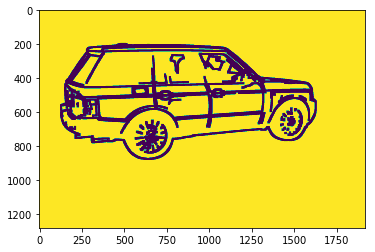

In [17]:
ret =get_edge_v2_randoms(final)
plt.imshow(ret)
print(ret.shape)
np.max(ret)

AxesImage(38.5601,27.8;382.64x245.485)


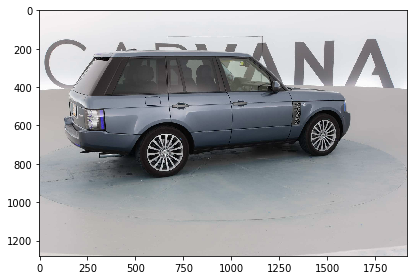

In [18]:
print(imshow(cv2.imread(carimage)))

In [19]:
from sklearn.model_selection import train_test_split
train_input, test_input, _, _ = train_test_split(input_files, input_files, test_size=0.15, random_state=42)
print(len(train_input))
print(len(test_input))

4324
764


Para augmentar las imagenes, vamos a usar la liberia conocida "imgaug", en siguiente kernels intentaremos desarrollar nuestros porpios augmentadores, trabajando con la numpy directamente.. pero esta liberia nos permite hacer una augmentación de manera muy rapida

In [20]:
from imgaug import augmenters as iaa
import imgaug as ia
sometimes = lambda aug: iaa.Sometimes(0.5, aug)
seq = iaa.Sequential([
    iaa.Crop(px=(0, 16)), # crop images from each side by 0 to 16px (randomly chosen)
    iaa.Fliplr(0.5), # horizontally flip 50% of the images
    # iaa.GaussianBlur(sigma=(0, 3.0)), # blur images with a sigma of 0 to 3.0
    sometimes(iaa.PerspectiveTransform(scale=(0.01, 0.1))),
    sometimes(iaa.Affine(
            scale={"x": (1, 1.2), "y": (1, 1.2)}, # scale images to 80-120% of their size, individually per axis
            #translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, # translate by -20 to +20 percent (per axis)
            #rotate=(-45, 45), # rotate by -45 to +45 degrees
            #shear=(-16, 16), # shear by -16 to +16 degrees
            #order=[0, 1], # use nearest neighbour or bilinear interpolation (fast)
            #cval=(0, 255), # if mode is constant, use a cval between 0 and 255
            mode=ia.ALL # use any of scikit-image's warping modes (see 2nd image from the top for examples)
        ))
])

Preparamos nuestra funciones de utilidad para nuestro augmentador

In [21]:
import skimage
BATCH_SIZE=32

def get_clean_image(path,path_mask):    
    img = cv2.imread(path)
    # img = cv2.resize(img, (h, w))
    # print(imshow(img))
    #mask = cv2.imread(maskimage)
    mask=np.int8((imread(path_mask)))
    # print(mask)   
    # get first masked value (foreground)
    fg = cv2.bitwise_or(img, img, mask=mask)
    # get second masked value (background) mask must be inverted
    mask = cv2.bitwise_not(mask)
    background = np.full(img.shape, 255, dtype=np.uint8)
    bk = cv2.bitwise_or(background, background, mask=mask)

    # combine foreground+background
    final = cv2.bitwise_or(fg, bk)

    return final

def generator_int(path, batch_size=BATCH_SIZE, normalize=True, augmented=True):
    
    #retedge = np.zeros((batch_size,H,W,3),dtype=np.int16)
    #retimg = np.zeros((batch_size,H,W,3),dtype=np.int16)
    retedge = []
    retimg = []
    imgorig=[]
    for x in range(batch_size):
        car = np.random.choice(path,1)[0]
        carpath = car_path+car
        maskpath = mask_path+car.replace('.jpg','_mask.gif')
        #print(maskpath)
        img =  get_clean_image(carpath, maskpath)
        retimg.append(img)
        #mask = get_edge_v2(retimg[x])
        #mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)
        #retedge.append(mask)
 #       retimg[x] = img
        #imgorig = img
        # print(retimg[x].shape)
        #print(np.max(retimg[x]))
        #mask = get_edge_v2(img)
        
        # mask = skimage.color.gray2rgb(mask.reshape(H,W,1))
        #print(mask.shape)
        #retedge[x] = mask
    #augmented images
    if augmented:
        retimg = seq.augment_images(np.array(retimg))
    else:
        retimg = np.array(retimg)
    #for x in range(batch_size):
#        imgorig.append(retimg[x])
    #
    for x in range(batch_size):
        #print(x)
        mask = get_edge_v2(retimg[x])
        mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)
        retedge.append(mask)
        
    
    #if normalize:
#        retimg = retimg/255
       # retedge = retedge/255
    return np.array(retedge), np.array(retimg)

In [22]:
indx=500
carimage = car_path+input_files[indx]
maskimage = mask_path+input_files[indx].replace('.jpg','_mask.gif')
# img = get_clean_image(carimage, maskimage)
A,B = generator_int(train_input,1,False)
B.shape

(1, 1280, 1918, 3)

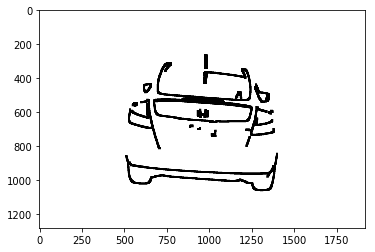

In [23]:
plt.imshow(A[0])


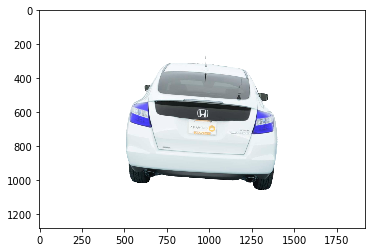

In [24]:
plt.imshow(B[0])

In [25]:
def downsample(img, h, w):    
    # ret = resize(img, (h, w), mode='constant', preserve_range=True)
    # plt.imshow(ret)
    return cv2.resize(img, (h, w))

def generator_resize(path="", batch_size=BATCH_SIZE, normalize=True, h=256, w=256, augmented=True):
    a,b = generator_int(path,batch_size,False, augmented)
    
    #resize image
    newA=[]
    newB=[]
    for x in range(batch_size):
        newA.append(downsample(a[x],h,w))
        newB.append(downsample(b[x],h,w))

    return np.array(newA), np.array(newB)

In [26]:
H = 256
W = 256
A, B = generator_resize(train_input,1, False, H,W)
A.shape

(1, 256, 256, 3)

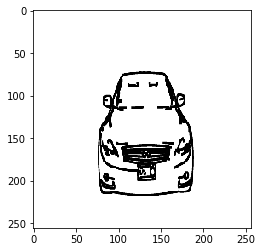

In [27]:
plt.imshow(A[0])

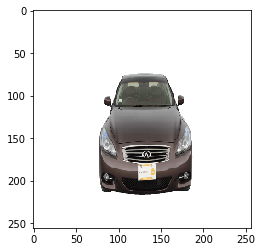

In [28]:
plt.imshow(B[0])

In [29]:
#Conseguido, tenemos un generador que aplica augmentacion a las imagenes y a las mascaras

In [30]:
from __future__ import print_function, division
import scipy

from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
import datetime
import matplotlib.pyplot as plt
import sys
import numpy as np
import os
from keras.layers import Layer, InputSpec
from keras import initializers, regularizers, constraints
from keras import backend as K


class InstanceNormalization(Layer):
    """Instance normalization layer.
    Normalize the activations of the previous layer at each step,
    i.e. applies a transformation that maintains the mean activation
    close to 0 and the activation standard deviation close to 1.
    # Arguments
        axis: Integer, the axis that should be normalized
            (typically the features axis).
            For instance, after a `Conv2D` layer with
            `data_format="channels_first"`,
            set `axis=1` in `InstanceNormalization`.
            Setting `axis=None` will normalize all values in each
            instance of the batch.
            Axis 0 is the batch dimension. `axis` cannot be set to 0 to avoid errors.
        epsilon: Small float added to variance to avoid dividing by zero.
        center: If True, add offset of `beta` to normalized tensor.
            If False, `beta` is ignored.
        scale: If True, multiply by `gamma`.
            If False, `gamma` is not used.
            When the next layer is linear (also e.g. `nn.relu`),
            this can be disabled since the scaling
            will be done by the next layer.
        beta_initializer: Initializer for the beta weight.
        gamma_initializer: Initializer for the gamma weight.
        beta_regularizer: Optional regularizer for the beta weight.
        gamma_regularizer: Optional regularizer for the gamma weight.
        beta_constraint: Optional constraint for the beta weight.
        gamma_constraint: Optional constraint for the gamma weight.
    # Input shape
        Arbitrary. Use the keyword argument `input_shape`
        (tuple of integers, does not include the samples axis)
        when using this layer as the first layer in a Sequential model.
    # Output shape
        Same shape as input.
    # References
        - [Layer Normalization](https://arxiv.org/abs/1607.06450)
        - [Instance Normalization: The Missing Ingredient for Fast Stylization](
        https://arxiv.org/abs/1607.08022)
    """
    def __init__(self,
                 axis=None,
                 epsilon=1e-3,
                 center=True,
                 scale=True,
                 beta_initializer='zeros',
                 gamma_initializer='ones',
                 beta_regularizer=None,
                 gamma_regularizer=None,
                 beta_constraint=None,
                 gamma_constraint=None,
                 **kwargs):
        super(InstanceNormalization, self).__init__(**kwargs)
        self.supports_masking = True
        self.axis = axis
        self.epsilon = epsilon
        self.center = center
        self.scale = scale
        self.beta_initializer = initializers.get(beta_initializer)
        self.gamma_initializer = initializers.get(gamma_initializer)
        self.beta_regularizer = regularizers.get(beta_regularizer)
        self.gamma_regularizer = regularizers.get(gamma_regularizer)
        self.beta_constraint = constraints.get(beta_constraint)
        self.gamma_constraint = constraints.get(gamma_constraint)

    def build(self, input_shape):
        ndim = len(input_shape)
        if self.axis == 0:
            raise ValueError('Axis cannot be zero')

        if (self.axis is not None) and (ndim == 2):
            raise ValueError('Cannot specify axis for rank 1 tensor')

        self.input_spec = InputSpec(ndim=ndim)

        if self.axis is None:
            shape = (1,)
        else:
            shape = (input_shape[self.axis],)

        if self.scale:
            self.gamma = self.add_weight(shape=shape,
                                         name='gamma',
                                         initializer=self.gamma_initializer,
                                         regularizer=self.gamma_regularizer,
                                         constraint=self.gamma_constraint)
        else:
            self.gamma = None
        if self.center:
            self.beta = self.add_weight(shape=shape,
                                        name='beta',
                                        initializer=self.beta_initializer,
                                        regularizer=self.beta_regularizer,
                                        constraint=self.beta_constraint)
        else:
            self.beta = None
        self.built = True

    def call(self, inputs, training=None):
        input_shape = K.int_shape(inputs)
        reduction_axes = list(range(0, len(input_shape)))

        if self.axis is not None:
            del reduction_axes[self.axis]

        del reduction_axes[0]

        mean = K.mean(inputs, reduction_axes, keepdims=True)
        stddev = K.std(inputs, reduction_axes, keepdims=True) + self.epsilon
        normed = (inputs - mean) / stddev

        broadcast_shape = [1] * len(input_shape)
        if self.axis is not None:
            broadcast_shape[self.axis] = input_shape[self.axis]

        if self.scale:
            broadcast_gamma = K.reshape(self.gamma, broadcast_shape)
            normed = normed * broadcast_gamma
        if self.center:
            broadcast_beta = K.reshape(self.beta, broadcast_shape)
            normed = normed + broadcast_beta
        return normed

    def get_config(self):
        config = {
            'axis': self.axis,
            'epsilon': self.epsilon,
            'center': self.center,
            'scale': self.scale,
            'beta_initializer': initializers.serialize(self.beta_initializer),
            'gamma_initializer': initializers.serialize(self.gamma_initializer),
            'beta_regularizer': regularizers.serialize(self.beta_regularizer),
            'gamma_regularizer': regularizers.serialize(self.gamma_regularizer),
            'beta_constraint': constraints.serialize(self.beta_constraint),
            'gamma_constraint': constraints.serialize(self.gamma_constraint)
        }
        base_config = super(InstanceNormalization, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

class DiscoGAN():
    def __init__(self):
        # Input shape
        self.img_rows = H
        self.img_cols = W
        self.channels = 3
        self.img_shape = (self.img_rows, self.img_cols, self.channels)

        # Configure data loader
        self.dataset_name = 'discogan'


        # Calculate output shape of D (PatchGAN)
        patch = int(self.img_rows / 2**4)
        self.disc_patch = (patch, patch, 1)

        # Number of filters in the first layer of G and D
        self.gf = 64
        self.df = 64

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminators
        self.d_A = self.build_discriminator()
        self.d_B = self.build_discriminator()
        self.d_A.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])
        self.d_B.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])

        #-------------------------
        # Construct Computational
        #   Graph of Generators
        #-------------------------

        # Build the generators
        self.g_AB = self.build_generator()
        self.g_BA = self.build_generator()

        # Input images from both domains
        img_A = Input(shape=self.img_shape)
        img_B = Input(shape=self.img_shape)

        # Translate images to the other domain
        fake_B = self.g_AB(img_A)
        fake_A = self.g_BA(img_B)
        # Translate images back to original domain
        reconstr_A = self.g_BA(fake_B)
        reconstr_B = self.g_AB(fake_A)

        # For the combined model we will only train the generators
        self.d_A.trainable = False
        self.d_B.trainable = False

        # Discriminators determines validity of translated images
        valid_A = self.d_A(fake_A)
        valid_B = self.d_B(fake_B)

        # Objectives
        # + Adversarial: Fool domain discriminators
        # + Translation: Minimize MAE between e.g. fake B and true B
        # + Cycle-consistency: Minimize MAE between reconstructed images and original
        self.combined = Model(inputs=[img_A, img_B],
                              outputs=[ valid_A, valid_B,
                                        fake_B, fake_A,
                                        reconstr_A, reconstr_B ])
        self.combined.compile(loss=['mse', 'mse',
                                    'mae', 'mae',
                                    'mae', 'mae'],
                              optimizer=optimizer)

    def build_generator(self):
        """U-Net Generator"""

        def conv2d(layer_input, filters, f_size=4, normalize=True):
            """Layers used during downsampling"""
            d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            d = LeakyReLU(alpha=0.2)(d)
            if normalize:
                d = InstanceNormalization()(d)
            return d

        def deconv2d(layer_input, skip_input, filters, f_size=4, dropout_rate=0):
            """Layers used during upsampling"""
            u = UpSampling2D(size=2)(layer_input)
            u = Conv2D(filters, kernel_size=f_size, strides=1, padding='same', activation='relu')(u)
            if dropout_rate:
                u = Dropout(dropout_rate)(u)
            u = InstanceNormalization()(u)
            u = Concatenate()([u, skip_input])
            return u

        # Image input
        d0 = Input(shape=self.img_shape)

        # Downsampling
        d1 = conv2d(d0, self.gf, normalize=False)
        d2 = conv2d(d1, self.gf*2)
        d3 = conv2d(d2, self.gf*4)
        d4 = conv2d(d3, self.gf*8)
        d5 = conv2d(d4, self.gf*8)
        d6 = conv2d(d5, self.gf*8)
        d7 = conv2d(d6, self.gf*8)

        # Upsampling
        u1 = deconv2d(d7, d6, self.gf*8)
        u2 = deconv2d(u1, d5, self.gf*8)
        u3 = deconv2d(u2, d4, self.gf*8)
        u4 = deconv2d(u3, d3, self.gf*4)
        u5 = deconv2d(u4, d2, self.gf*2)
        u6 = deconv2d(u5, d1, self.gf)

        u7 = UpSampling2D(size=2)(u6)
        output_img = Conv2D(self.channels, kernel_size=4, strides=1,
                            padding='same', activation='tanh')(u7)

        return Model(d0, output_img)

    def build_discriminator(self):

        def d_layer(layer_input, filters, f_size=4, normalization=True):
            """Discriminator layer"""
            d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            d = LeakyReLU(alpha=0.2)(d)
            if normalization:
                d = InstanceNormalization()(d)
            return d

        img = Input(shape=self.img_shape)

        d1 = d_layer(img, self.df, normalization=False)
        d2 = d_layer(d1, self.df*2)
        d3 = d_layer(d2, self.df*4)
        d4 = d_layer(d3, self.df*8)

        validity = Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, sample_interval=50):

        start_time = datetime.datetime.now()

        # Adversarial loss ground truths
        valid = np.ones((batch_size,) + self.disc_patch)
        fake = np.zeros((batch_size,) + self.disc_patch)

        for epoch in range(epochs):

            for batch_i in range(batch_size): 

                imgs_B, imgs_A =  generator_resize(train_input,batch_size, False, H,W,True)
                #generator(train_input,batch_size,False)
                
                imgs_A = (imgs_A/127.5)-1
                imgs_B = (imgs_B/127.5)-1
                # ----------------------
                #  Train Discriminators
                # ----------------------

                # Translate images to opposite domain
                fake_B = self.g_AB.predict(imgs_A)
                fake_A = self.g_BA.predict(imgs_B)

                # Train the discriminators (original images = real / translated = Fake)
                dA_loss_real = self.d_A.train_on_batch(imgs_A, valid)
                dA_loss_fake = self.d_A.train_on_batch(fake_A, fake)
                dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)

                dB_loss_real = self.d_B.train_on_batch(imgs_B, valid)
                dB_loss_fake = self.d_B.train_on_batch(fake_B, fake)
                dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

                # Total disciminator loss
                d_loss = 0.5 * np.add(dA_loss, dB_loss)

                # ------------------
                #  Train Generators
                # ------------------

                # Train the generators
                g_loss = self.combined.train_on_batch([imgs_A, imgs_B], [valid, valid, \
                                                                         imgs_B, imgs_A, \
                                                                         imgs_A, imgs_B])

                elapsed_time = datetime.datetime.now() - start_time
                # Plot the progress
                print ("[%d] [%d/%d] time: %s, [d_loss: %f, g_loss: %f]" % (epoch, batch_i,
                                                                        batch_size,
                                                                        elapsed_time,
                                                                        d_loss[0], g_loss[0]))

                # If at save interval => save generated image samples
                if batch_i % sample_interval == 0:
                    self.sample_images(epoch, batch_i)

    def sample_images(self, epoch, batch_i):
        os.makedirs('images/%s' % self.dataset_name, exist_ok=True)
        r, c = 2, 3
        imgs_B, imgs_A =  generator_resize(train_input,1, False, H,W,True)

                
        imgs_A = (imgs_A/127.5)-1
        imgs_B = (imgs_B/127.5)-1
        

        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        titles = ['Original', 'Translated', 'Reconstructed']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt])
                axs[i, j].set_title(titles[j])
                axs[i,j].axis('off')
                cnt += 1
        fig.savefig("images/%s/%d_%d.png" % (self.dataset_name, epoch, batch_i))
plt.close()






Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.


/opt/conda/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


[0] [0/16] time: 0:00:43.418004, [d_loss: 6.395549, g_loss: 230.397049]
[0] [1/16] time: 0:00:49.670373, [d_loss: 121.684792, g_loss: 236.860199]
[0] [2/16] time: 0:00:55.518103, [d_loss: 51.514854, g_loss: 47.344162]
[0] [3/16] time: 0:01:01.131477, [d_loss: 6.525677, g_loss: 9.306596]
[0] [4/16] time: 0:01:06.827514, [d_loss: 2.342595, g_loss: 6.325655]
[0] [5/16] time: 0:01:12.561846, [d_loss: 3.102539, g_loss: 9.610450]
[0] [6/16] time: 0:01:18.273943, [d_loss: 2.300605, g_loss: 7.499967]
[0] [7/16] time: 0:01:24.091894, [d_loss: 0.242164, g_loss: 5.133873]
[0] [8/16] time: 0:01:29.736247, [d_loss: 0.212585, g_loss: 5.603065]
[0] [9/16] time: 0:01:35.808114, [d_loss: 0.147918, g_loss: 5.429916]
[0] [10/16] time: 0:01:41.698180, [d_loss: 0.177607, g_loss: 5.084919]
[0] [11/16] time: 0:01:47.628913, [d_loss: 0.120249, g_loss: 5.031546]
[0] [12/16] time: 0:01:53.188362, [d_loss: 0.184338, g_loss: 5.233795]
[0] [13/16] time: 0:01:58.829233, [d_loss: 0.127987, g_loss: 4.219879]
[0] [14/

/opt/conda/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


[10] [1/16] time: 0:16:13.146319, [d_loss: 0.358055, g_loss: 1.817084]
[10] [2/16] time: 0:16:19.294088, [d_loss: 0.389106, g_loss: 1.702547]
[10] [3/16] time: 0:16:25.065833, [d_loss: 0.367989, g_loss: 1.627503]
[10] [4/16] time: 0:16:30.861169, [d_loss: 0.359723, g_loss: 1.647578]
[10] [5/16] time: 0:16:36.745737, [d_loss: 0.390362, g_loss: 1.602947]
[10] [6/16] time: 0:16:42.343856, [d_loss: 0.366688, g_loss: 1.634079]
[10] [7/16] time: 0:16:48.122954, [d_loss: 0.371433, g_loss: 1.612909]
[10] [8/16] time: 0:16:53.814285, [d_loss: 0.383101, g_loss: 1.671358]
[10] [9/16] time: 0:16:59.647653, [d_loss: 0.386464, g_loss: 1.498669]
[10] [10/16] time: 0:17:05.339813, [d_loss: 0.385171, g_loss: 1.525892]
[10] [11/16] time: 0:17:11.296610, [d_loss: 0.368512, g_loss: 1.610194]
[10] [12/16] time: 0:17:16.728722, [d_loss: 0.379568, g_loss: 1.581930]
[10] [13/16] time: 0:17:22.244484, [d_loss: 0.377017, g_loss: 1.535591]
[10] [14/16] time: 0:17:27.833164, [d_loss: 0.393125, g_loss: 1.462621]
[

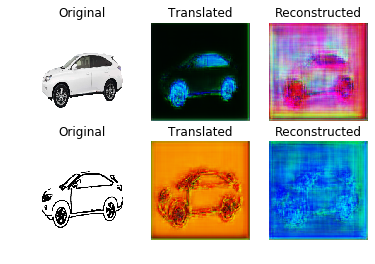

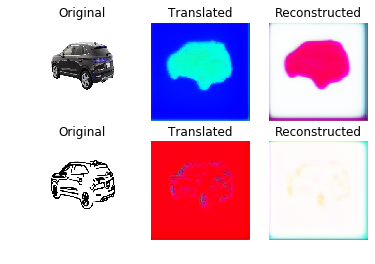

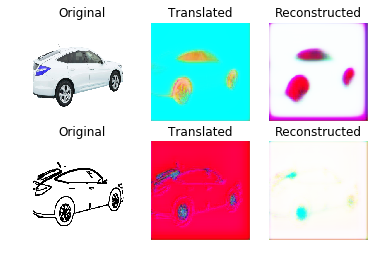

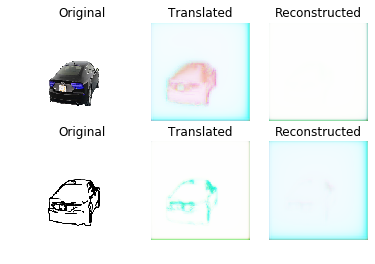

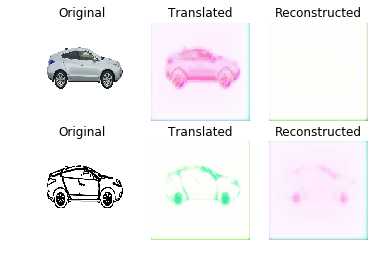

...

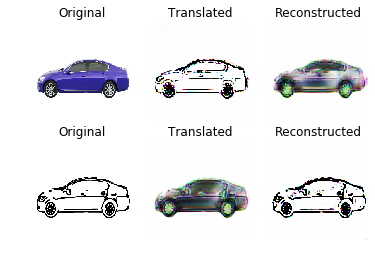

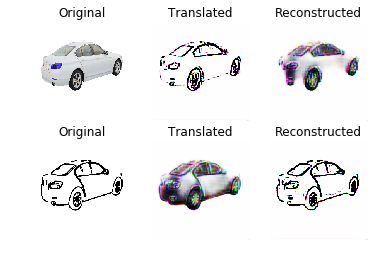

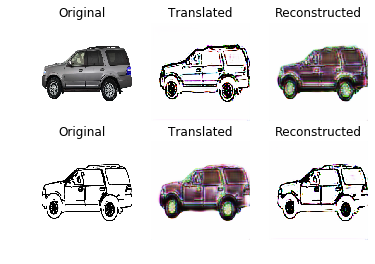

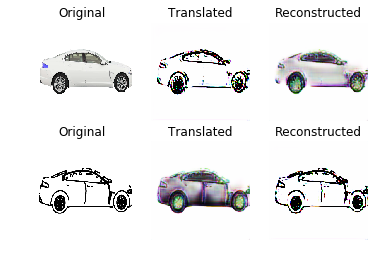

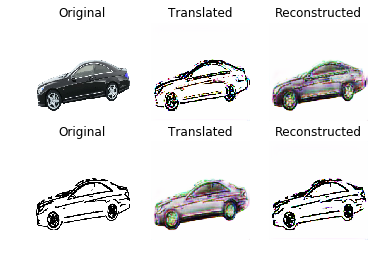

In [31]:
discgan = DiscoGAN()
discgan.train(epochs=50, batch_size=16, sample_interval=10)

In [32]:
####################
def files_names_in_path(path="",extension=".jpg"):
    files = []
    for f in os.listdir(path):
        filename, file_extension = os.path.splitext(f)
        if file_extension == extension:
            files.append(path+f)
    return files

epoch_plot = files_names_in_path('images/discogan/',extension='.png')

In [33]:
epoch_plot

['images/discogan/21_10.png',
 'images/discogan/49_10.png',
 'images/discogan/43_10.png',
 'images/discogan/17_10.png',
 'images/discogan/46_0.png',
 'images/discogan/37_10.png',
 'images/discogan/39_10.png',
 'images/discogan/32_10.png',
 'images/discogan/41_0.png',
 'images/discogan/23_0.png',
 'images/discogan/33_0.png',
 'images/discogan/12_10.png',
 'images/discogan/44_10.png',
 'images/discogan/48_0.png',
 'images/discogan/14_10.png',
 'images/discogan/26_0.png',
 'images/discogan/36_0.png',
 'images/discogan/5_10.png',
 'images/discogan/26_10.png',
 'images/discogan/18_0.png',
 'images/discogan/48_10.png',
 'images/discogan/2_0.png',
 'images/discogan/18_10.png',
 'images/discogan/35_0.png',
 'images/discogan/15_10.png',
 'images/discogan/19_10.png',
 'images/discogan/2_10.png',
 'images/discogan/40_0.png',
 'images/discogan/24_10.png',
 'images/discogan/28_10.png',
 'images/discogan/4_0.png',
 'images/discogan/7_0.png',
 'images/discogan/9_10.png',
 'images/discogan/13_0.png',


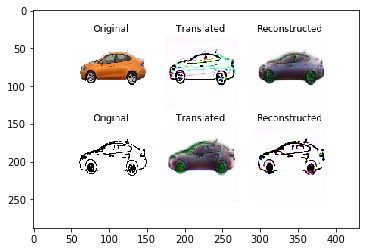

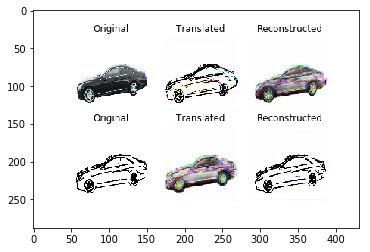

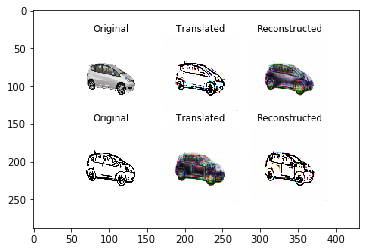

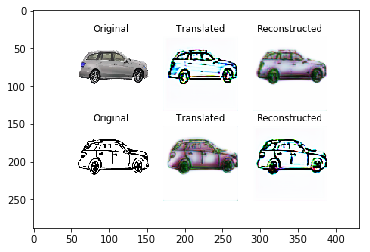

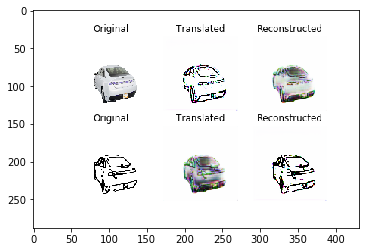

...

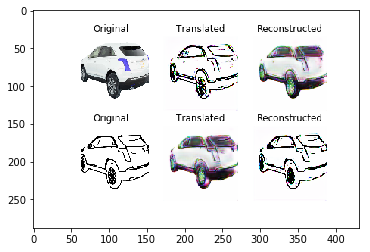

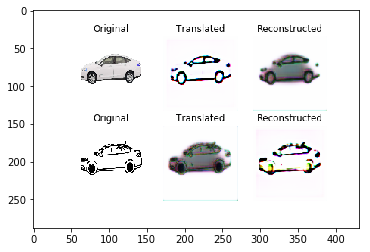

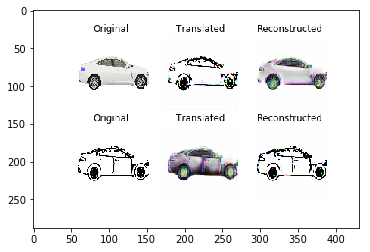

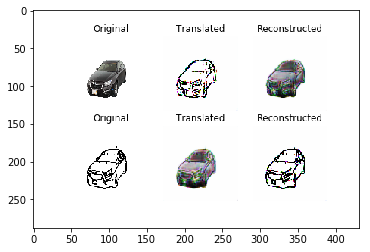

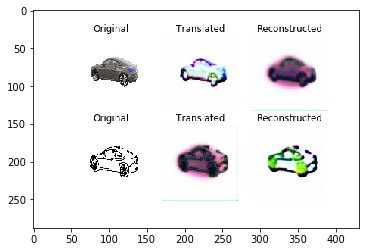

In [34]:


import matplotlib.pyplot as plt
%matplotlib inline

for x in epoch_plot:
    plt.imshow(imread(x))
    plt.show()



In [35]:
imgs_B, imgs_A =  generator_resize(test_input,3, False, H,W,True)
                #generator(train_input,batch_size,False)
    
imgs_A = (imgs_A/127.5)-1
imgs_B = (imgs_B/127.5)-1


# Translate images to the other domain
fake_B = discgan.g_AB.predict(imgs_A)
fake_A = discgan.g_BA.predict(imgs_B)
# Translate back to original domain
reconstr_A = discgan.g_BA.predict(fake_B)
reconstr_B = discgan.g_AB.predict(fake_A)

imgs_A = 0.5*imgs_A+0.5
imgs_B = 0.5*imgs_B+0.5
fake_B = 0.5*fake_B+0.5
fake_A = 0.5*fake_A+0.5
reconstr_A = 0.5*reconstr_A+0.5
reconstr_B = 0.5*reconstr_B+0.5

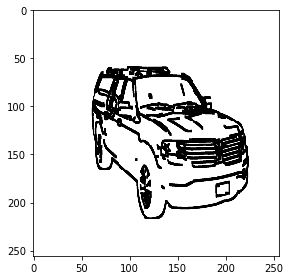

In [36]:
imshow(imgs_B[0])

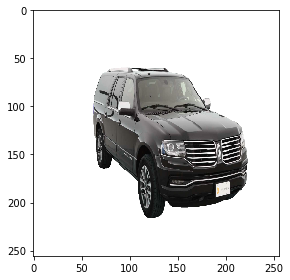

In [37]:
imshow(imgs_A[0])

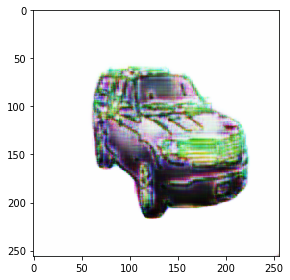

In [38]:
imshow(fake_A[0])

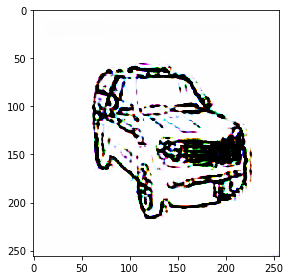

In [39]:
imshow(fake_B[0])

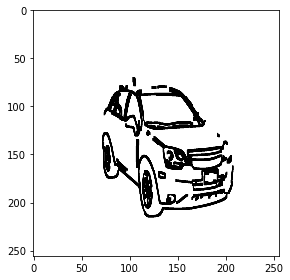

In [40]:
imshow(imgs_B[1])

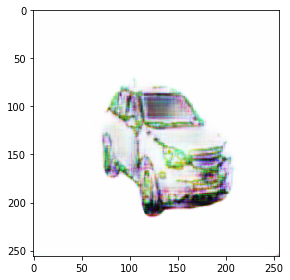

In [41]:
imshow(fake_A[1])

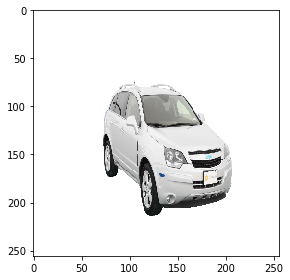

In [42]:
imshow(imgs_A[1])

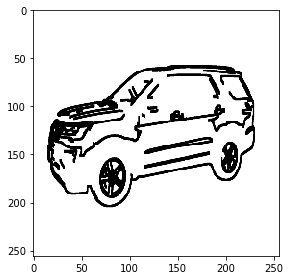

In [43]:
imshow(imgs_B[2])

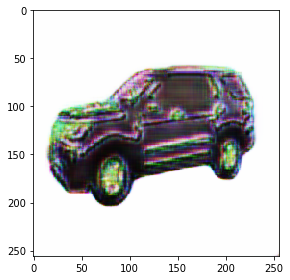

In [44]:
imshow(fake_A[2])

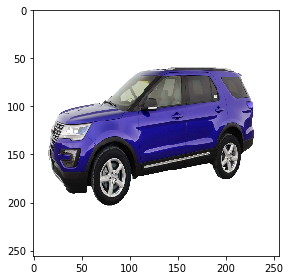

In [45]:
imshow(imgs_A[2])

In [46]:
#####No tiene mala pinta tampoco pix2pix parece mejor resultado pero discgan parece que reentrena menos...
#####Seguimos